In [1]:
import numpy as np
from copy import deepcopy
import matplotlib.pyplot as plt
from pyuvdata import UVBeam
from matplotlib.colors import LogNorm

from numpy.fft import fftshift, fftfreq, fft
from scipy import signal

import astropy.constants as const

In [2]:
import matplotlib as mpl
mpl.rcParams['xtick.major.size']  = 6
mpl.rcParams['ytick.major.size']  = 6
mpl.rcParams['xtick.minor.size']  = 3
mpl.rcParams['ytick.minor.size']  = 3
mpl.rcParams['xtick.major.width'] = 1.0
mpl.rcParams['ytick.major.width'] = 1.0
mpl.rcParams['xtick.minor.width'] = 1.0
mpl.rcParams['ytick.minor.width'] = 1.0
mpl.rcParams['axes.linewidth'] = 1.0
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['figure.facecolor'] = 'white'

In [3]:
def colorbar_plotter(fig,ax,im,label):
        
    pos = ax.get_position()
    cbarax = fig.add_axes([pos.x0 + pos.width+0.01, pos.y0, 0.005, pos.height])

    cbar = fig.colorbar(im,cax=cbarax)

    cbar.ax.tick_params(labelsize=14) 
    cbar.ax.set_ylabel(label,fontsize=14)
    
    return cbar

def get_power_beam(beam):
    uvb = beam.efield_to_power(calc_cross_pols=False,inplace=False)
    return uvb.data_array[0,0]

def cross_power_beam(beam1, beam2):
    power = beam1[0,0]*np.conj(beam2[0,0]) + beam1[1,0]*np.conj(beam2[1,0])
    return power
        
def dB(x):
    return 10.*np.log10(x/x.max())

def FFT(d,dt=0.5):
    x = d*(signal.blackmanharris(d.shape[1]))[np.newaxis,:,np.newaxis,np.newaxis]
    return fftshift(fftfreq(d.shape[1],d=dt)),fftshift(fft(x,axis=1),axes=1)

def nearest_idx(data,val):
    return np.abs(data - val).argmin()

def normalize(data):
    norm = np.max(data,axis=(1,2,3))
    return data/norm[:,np.newaxis,np.newaxis,np.newaxis]

Text(0, 0.5, 'y-direction--> $[$m$]$')

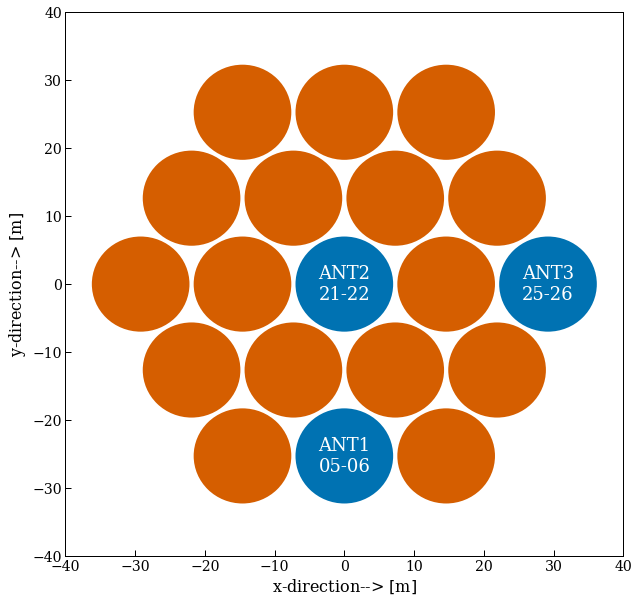

In [4]:
#Array configuration used in CST simulations

ant_pos = np.loadtxt('HERA_positions/antenna_positions_19.dat')[:,:-1]
ant_id = [9,11,17]

ant_pos = ant_pos -  ant_pos[9,:][np.newaxis,:]

ant_name = ['ANT2\n21-22','ANT3\n25-26','ANT1\n05-06']
colors = ["#D55E00", "#0072B2"]

fig, axs = plt.subplots(nrows=1,ncols=1,figsize=(10,10))
j=0
for i in range(ant_pos.shape[0]):
    if (i in ant_id):
        ant = plt.Circle((ant_pos[i,0],ant_pos[i,1]),7.,facecolor=colors[1])
        plt.text(ant_pos[i,0],ant_pos[i,1],ant_name[j],horizontalalignment='center',
                 verticalalignment='center',multialignment='center',fontsize=18,color='white') 
        
        j+=1
    else:
        ant = plt.Circle((ant_pos[i,0],ant_pos[i,1]),7.,facecolor=colors[0])

    axs.add_artist(ant)

axs.set_xlim(-40.,40.)
axs.set_ylim(-40.,40.)

axs.tick_params(axis='both',direction='in',which='both',labelsize=14)

axs.set_xlabel(r'x-direction--> $[$m$]$',fontsize=16)
axs.set_ylabel(r'y-direction--> $[$m$]$',fontsize=16)

In [5]:
##Read beam files

beamfiles = ['NicolasFagnoniBeams/NF_HERA_Dipole_efield_beam.fits',
             'NF_HERA_ccbeam_Dipole-Efield_port05-06_ph-corr.fits',
             'NF_HERA_ccbeam_Dipole-Efield_port21-22_ph-corr.fits',
             'NF_HERA_ccbeam_Dipole-Efield_port25-26_ph-corr.fits']

beams = []

for beamfile in beamfiles:
    
    uvb = UVBeam()
    uvb.read_beamfits(beamfile)
    beams.append(uvb)

beams[0].freq_interp_kind = 'linear'
beams[0].interpolation_function = 'az_za_simple'
beam_interp = beams[0].interp(freq_array=beams[1].freq_array[0],new_object=True)
beams[0] = beam_interp

In [6]:
#Get E-field and Power Beams from uvbeam objects

E_beam = []
P_beam = []
for beam in beams:
    data = beam.data_array
    E_beam.append(data)
    power = get_power_beam(beam)
    P_beam.append(power)
    
titles = ['Old beam', 'Port 5-6 (ANT1)', 'Port 21-22 (ANT2)', 'Port 25-26 (ANT3)']

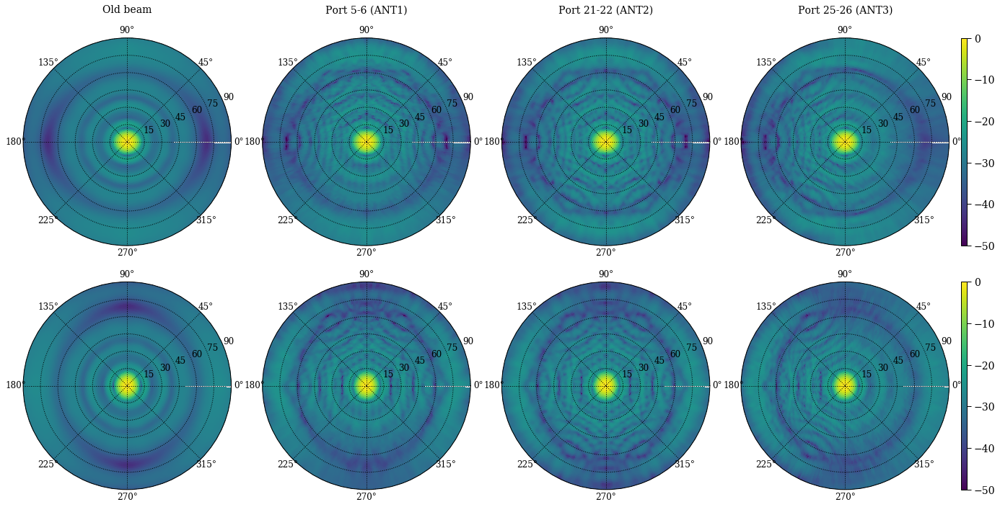

In [7]:
#Plotting Beam power patterns at 150 MHz

freqs = beams[0].freq_array[0]
freq_idx = nearest_idx(freqs,150.e6)
theta = beams[0].axis2_array
phi = beams[0].axis1_array

AZ, ZA = np.meshgrid(phi,theta*180./np.pi)

fig1, axs = plt.subplots(nrows=2,ncols=4,figsize=(23,12),subplot_kw=dict(polar=True))
fig1.subplots_adjust(wspace=0.15,hspace=0.08)

for i in range(4):
    for j in range(2):
        im = axs[j,i].pcolormesh(AZ,ZA,dB(P_beam[i][j,freq_idx,:,:]),vmin=-50,vmax=0.)
        axs[j,i].set_ylim(0,90.)
        axs[j,i].tick_params(axis='both',direction='in',which='both',labelsize=12)
        axs[j,i].set_yticks([15,30,45,60,75,90])
        axs[j,i].grid(lw=1,ls=':',c='k')
        if i==3:
            colorbar_plotter(fig1,axs[j,i],im,r'')        
        if j==0:
            axs[j,i].set_title(titles[i],y=1.1,fontsize=14)

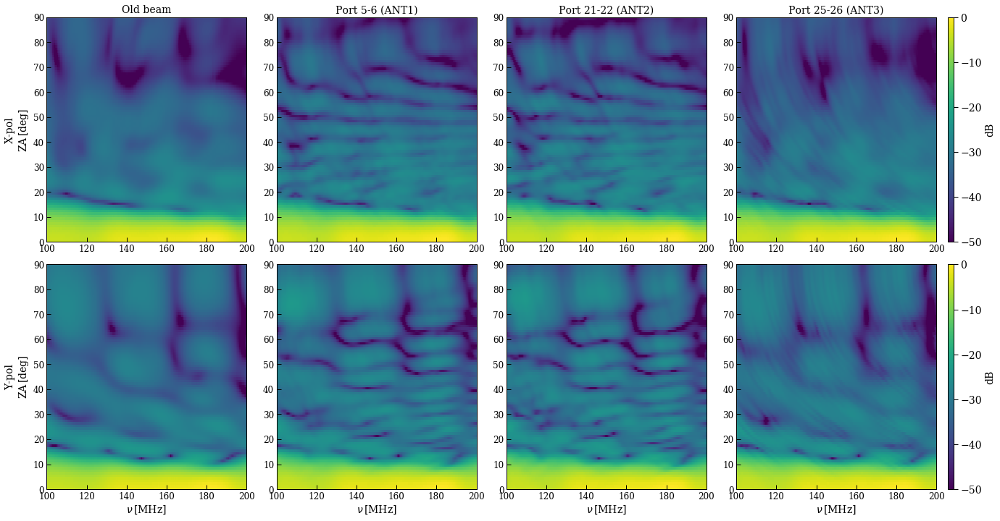

In [8]:
#Beam pattern waterfalls at phi=0

nu_g, za_g = np.meshgrid(freqs/1.e6,theta*180./np.pi)

fig3, axs = plt.subplots(nrows=2,ncols=4,figsize=(22,12))
fig3.subplots_adjust(wspace=0.15,hspace=0.1)

for i in range(4):  
    for j in range(2):
        if j==0:
            axs[j,i].set_title(titles[i],fontsize=14)
        im = axs[j,i].pcolormesh(nu_g,za_g,dB(P_beam[i][j,:,:,0]).T,vmin=-50,vmax=0)
        axs[j,i].set_xlim(100.,200.)
        axs[j,i].set_ylim(0.,90.)
        if i==3:
            colorbar_plotter(fig3,axs[j,i],im,r'dB')
        axs[j,i].tick_params(axis='both',direction='in',which='both',labelsize=12)
        
        if i==0:
            if j==0:
                axs[j,i].set_ylabel('X-pol\n'+r'ZA$\,[$deg$]$',fontsize=14)
            else:
                axs[j,i].set_ylabel('Y-pol\n'+r'ZA$\,[$deg$]$',fontsize=14)
        if j==1:
            axs[j,i].set_xlabel(r'$\nu\,[$MHz$]$',fontsize=14)
            

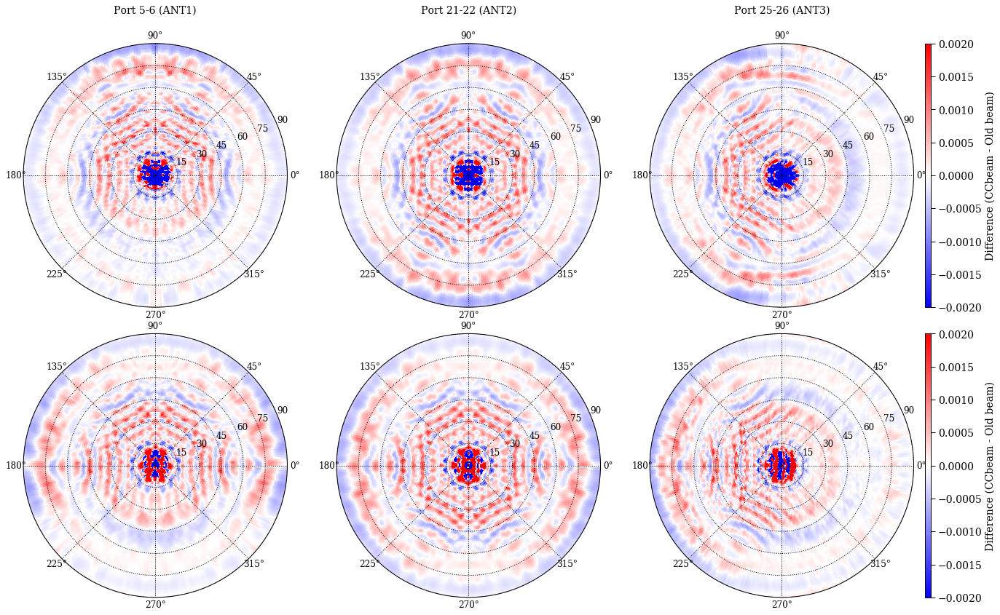

In [9]:
#Difference between CC power beams and old power beam (in dB).

fig4, axs = plt.subplots(nrows=2,ncols=3,figsize=(22,14),subplot_kw=dict(polar=True))
fig4.subplots_adjust(wspace=0.17,hspace=0.1)

for i in range(3):
    for j in range(2):       
        
        im = axs[j,i].pcolormesh(AZ,ZA,normalize(P_beam[i+1])[j,freq_idx,:,:] - normalize(P_beam[0])[j,freq_idx,:,:], vmin=-0.002, vmax=0.002, cmap='bwr')

        axs[j,i].set_ylim(0,90.)
        axs[j,i].set_yticks([15,30,45,60,75,90])
        axs[j,i].grid(lw=1,ls=':',c='k')
        
        if i==2:
            colorbar_plotter(fig4,axs[j,i],im,r'Difference (CCbeam - Old beam)')
        axs[j,i].tick_params(axis='both',direction='in',which='both',labelsize=12)
        if j==0:    
            axs[j,i].set_title(titles[i+1],y=1.1,fontsize=14)

In [10]:
#select 100-200 MHz frequency range and calculate delay spectra of power beams

new_freqs = freqs[100:301]
df = new_freqs[1] - new_freqs[0]

F_Pbeams = []
for i in range(4):
    delays, FPbeam = FFT(P_beam[i][:,100:301],dt=df)
    FPbeam_norm  = np.abs(FPbeam)
    FPbeam_norm /= np.max(FPbeam_norm,axis=(1,2,3))[:,np.newaxis,np.newaxis,np.newaxis]
    F_Pbeams.append(FPbeam_norm)

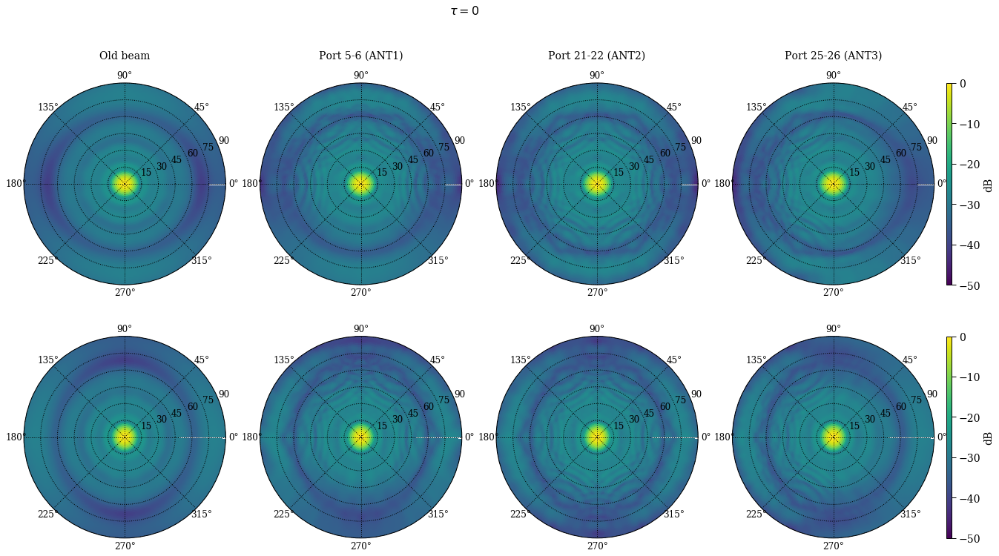

In [11]:
#Plot tau = 0 mode of delay spectra

idx_delay0 = nearest_idx(delays,0.0)
fig5, axs = plt.subplots(nrows=2,ncols=4,figsize=(22,12),subplot_kw=dict(polar=True))
fig5.subplots_adjust(wspace=0.17,hspace=0.1)
fig5.suptitle(r'$\tau = 0$',fontsize=16)
for i in range(2):
    for j in range(4):

        im = axs[i,j].pcolormesh(AZ,ZA,dB(F_Pbeams[j][i,idx_delay0,:,:]),vmin=-50,vmax=0)  
        axs[i,j].set_yticks([15,30,45,60,75,90])
        axs[i,j].grid(lw=1,ls=':',c='k')
        if j==3:
            colorbar_plotter(fig5,axs[i,j],im,r'dB')        
        
        axs[i,j].set_ylim(0,90.)
        axs[i,j].tick_params(axis='both',direction='in',which='both',labelsize=12)
        if i==0: 
            axs[i,j].set_title(titles[j],y=1.1,fontsize=14)

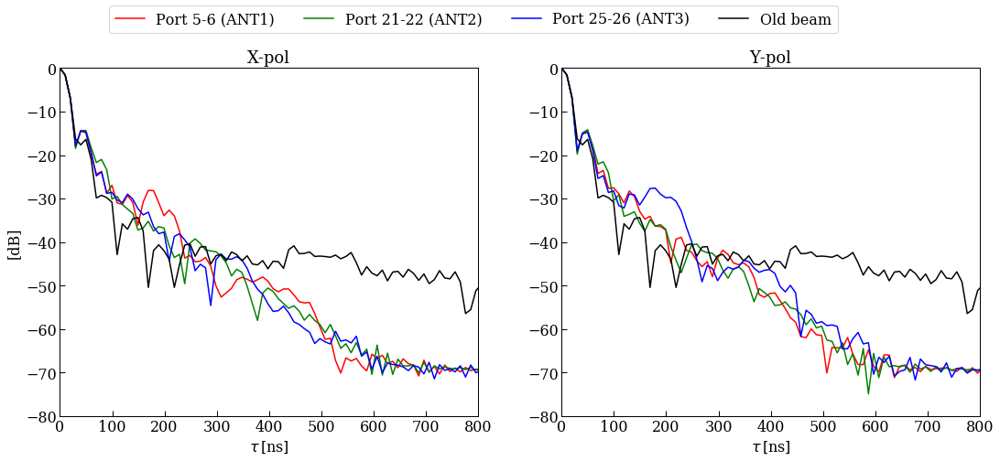

In [12]:
#Plotting delay spectrum of Power beams for zenith pointing, theta=0, phi=0

color = ['r','g','b','k']

fig6, axs = plt.subplots(nrows=1,ncols=2,figsize=(18,7))

for i in range(2):
    for j in range(4):
        if j!=3:
            axs[i].plot(delays*1.e9,dB(F_Pbeams[j+1][i,:,0,0]),label=titles[j+1],c=color[j])
        else:
            axs[i].plot(delays*1.e9,dB(F_Pbeams[0][i,:,0,0]),label=titles[0],c=color[j])
            
    axs[i].set_xlabel(r'$\tau\,[$ns$]$',fontsize=16)
    if i==0:
        axs[i].set_ylabel('[dB]',fontsize=16)
    axs[i].set_xlim(0,800.)
    axs[i].set_ylim(-80.,0.)
    axs[i].tick_params(axis='both',direction='in',which='both',labelsize=16)
    
axs[0].set_title('X-pol',fontsize=18)
axs[1].set_title('Y-pol',fontsize=18)    

handles, labels = axs[0].get_legend_handles_labels()
axs[0].legend(handles,labels,fontsize=16,ncol=4,loc='upper left',bbox_to_anchor=(0.1,1.2))
    

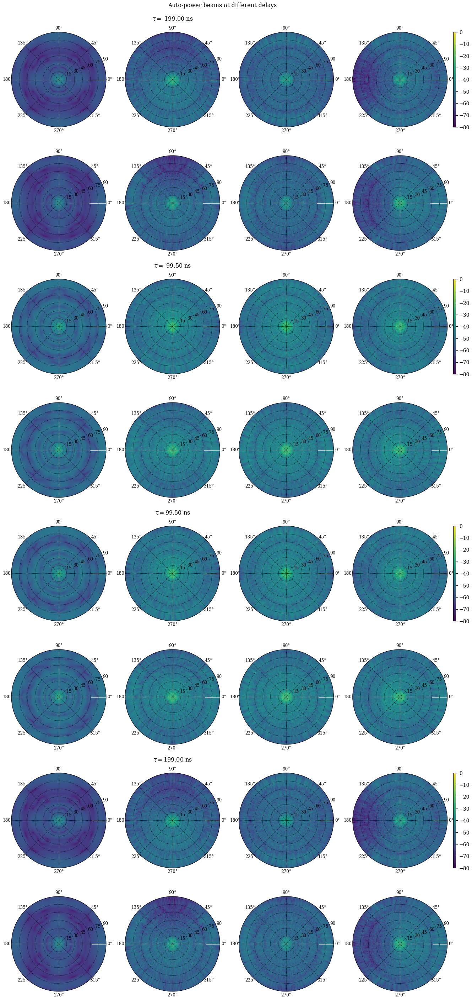

In [13]:
#Power beams (both polarizations) at different delays, tau = -200ns, -100ns, 100ns, 200ns

idx = [nearest_idx(delays, -2.e-7),
       nearest_idx(delays, -1.e-7), 
       nearest_idx(delays, 1.e-7), 
       nearest_idx(delays, 2.e-7)]

fig7, axs = plt.subplots(nrows=8,ncols=4,figsize=(22,50),subplot_kw=dict(polar=True))

fig7.suptitle(r'Auto-power beams at different delays',fontsize=16,y=0.9)

for i in range(4):
    for j in range(4):

        im1 = axs[2*i,j].pcolormesh(AZ,ZA,dB(F_Pbeams[j])[0,idx[i],:,:],vmin=-80,vmax=0)  
        im2 = axs[2*i+1,j].pcolormesh(AZ,ZA,dB(F_Pbeams[j])[1,idx[i],:,:],vmin=-80,vmax=0)
        
        if j==3:
            colorbar_plotter(fig7,axs[2*i,j],im1,r'')        
        
        axs[2*i,j].set_ylim(0,90.)
        axs[2*i+1,j].set_ylim(0,90.)             
        axs[2*i,j].tick_params(axis='both',direction='in',which='both',labelsize=12)
        axs[2*i+1,j].tick_params(axis='both',direction='in',which='both',labelsize=12)
    
        axs[2*i,j].set_yticks([15,30,45,60,75,90])
        axs[2*i+1,j].set_yticks([15,30,45,60,75,90])
        
        axs[2*i,j].grid(lw=1,ls=':',c='k')
        axs[2*i+1,j].grid(lw=1,ls=':',c='k')
        
        if j==1:
            axs[2*i,j].set_title(r'$\tau =$' + '%.2f ns'%(delays[idx[i]]*1.e9),y=1.1,fontsize=16)
    

In [14]:
#calculate cross power beams for the three antenna pairs

ccbeams = [cross_power_beam(E_beam[1],E_beam[2]),
           cross_power_beam(E_beam[2],E_beam[3]),
           cross_power_beam(E_beam[1],E_beam[3])]

cc_titles = ['ANT1-ANT2','ANT2-ANT3','ANT1-ANT3']

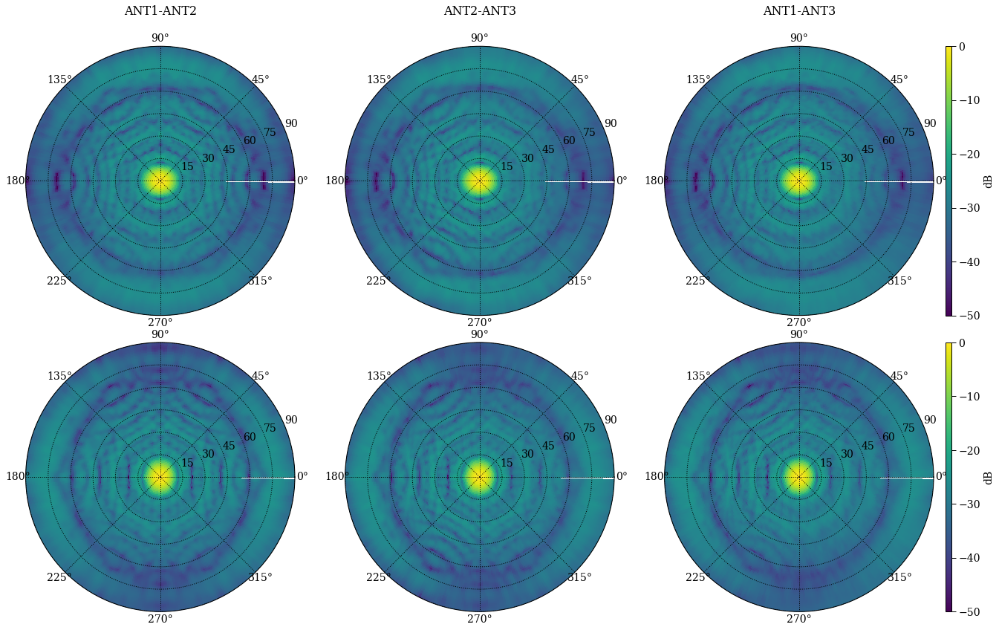

In [15]:
#Plot cross power beams at 150 MHz

fig8, axs = plt.subplots(nrows=2,ncols=3,figsize=(22,14),subplot_kw=dict(polar=True))
fig8.subplots_adjust(wspace=0.17,hspace=0.1)

for i in range(3):
    for j in range(2):       
        
        if j==0:    
            axs[j,i].set_title(cc_titles[i],y=1.1,fontsize=16)
        im = axs[j,i].pcolormesh(AZ,ZA,dB(np.abs(ccbeams[i][j,200,:,:])),vmin=-50,vmax=0)
        
        axs[j,i].set_ylim(0,90.)
        axs[j,i].set_yticks([15,30,45,60,75,90])
        axs[j,i].grid(lw=1,ls=':',c='k')
        
        if i==2:
            colorbar_plotter(fig8,axs[j,i],im,r'dB')
        axs[j,i].tick_params(axis='both',direction='in',which='both',labelsize=14)

In [16]:
#Delay transform of cross power beams
F_ccbeams = []
for i in range(3):
    delays, Fbeam = FFT(ccbeams[i][:,100:301],dt=df)
    Fbeam_norm  = np.abs(Fbeam)
    Fbeam_norm /= np.max(Fbeam_norm,axis=(1,2,3))[:,np.newaxis,np.newaxis,np.newaxis]
    F_ccbeams.append(Fbeam_norm)

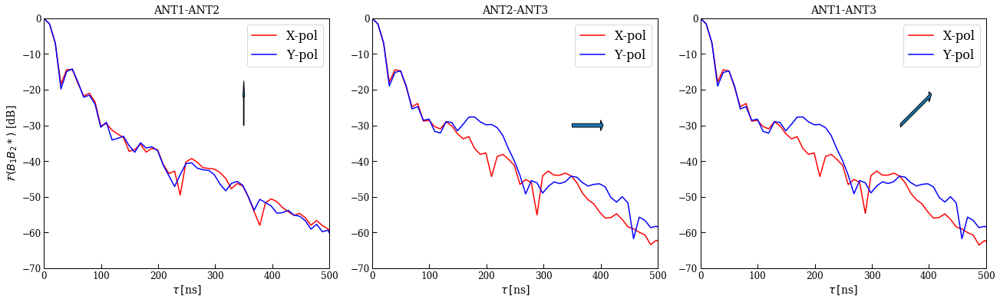

In [17]:
#Delay spectra of cross power beams at zenith pointing, theta=0, phi=0
arrows = [350.,-30.]
dx = [0.,50.,50.]
dy = [8.,0.,8.]

fig9, axs = plt.subplots(nrows=1,ncols=3,figsize=(22,6))
fig9.subplots_adjust(wspace=0.15)

for i in range(3):
    axs[i].plot(delays*1.e9,dB(F_ccbeams[i])[0,:,0,0],label='X-pol',c='r')
    axs[i].plot(delays*1.e9,dB(F_ccbeams[i])[1,:,0,0],label='Y-pol',c='b')
    axs[i].arrow(arrows[0],arrows[1],dx=dx[i],dy=dy[i],width=1.0)

    axs[i].set_xlabel(r'$\tau\,[$ns$]$',fontsize=14)
    if i==0:
        axs[i].set_ylabel('$\mathcal{F}(B_1B_2*)$ [dB]',fontsize=14)
    axs[i].set_xlim(0,500.)
    axs[i].set_ylim(-70.,0.)
    
    axs[i].set_title(cc_titles[i],fontsize=14)
    
    handles, labels = axs[i].get_legend_handles_labels()
    axs[i].legend(handles,labels,fontsize=16,ncol=1,loc='upper right')
    axs[i].tick_params(axis='both',direction='in',which='both',labelsize=12)
    

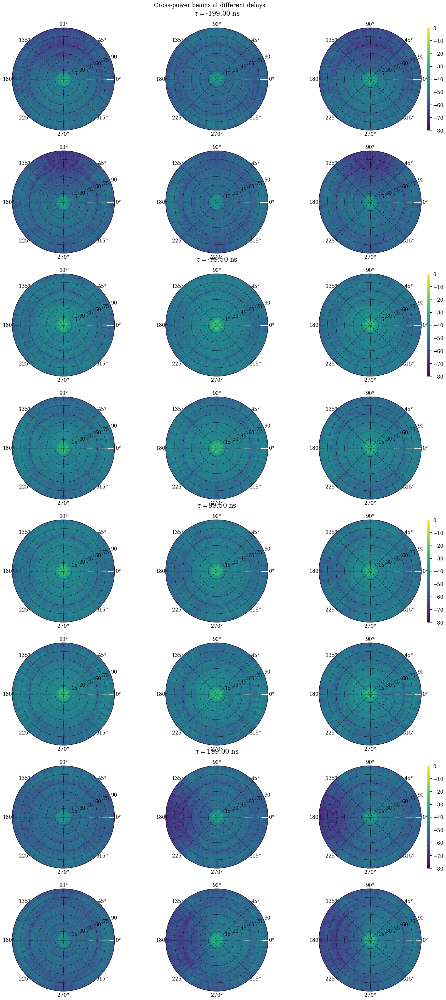

In [18]:
#Cross Power beams (both polarizations) at different delays, tau = -200ns, -100ns, 100ns, 200ns

fig10, axs = plt.subplots(nrows=8,ncols=3,figsize=(22,50),subplot_kw=dict(polar=True))

fig10.suptitle(r'Cross-power beams at different delays',fontsize=16,y=0.9)

for i in range(4):
    for j in range(3):

        im1 = axs[2*i,j].pcolormesh(AZ,ZA,dB(F_ccbeams[j])[0,idx[i],:,:],vmin=-80,vmax=0)  
        im2 = axs[2*i+1,j].pcolormesh(AZ,ZA,dB(F_ccbeams[j])[1,idx[i],:,:],vmin=-80,vmax=0)
        
        if j==2:
            colorbar_plotter(fig10,axs[2*i,j],im1,r'')        
        
        axs[2*i,j].set_ylim(0,90.)
        axs[2*i+1,j].set_ylim(0,90.)
        
        axs[2*i,j].set_yticks([15,30,45,60,75,90])
        axs[2*i+1,j].set_yticks([15,30,45,60,75,90])
        
        axs[2*i,j].tick_params(axis='both',direction='in',which='both',labelsize=14)
        axs[2*i+1,j].tick_params(axis='both',direction='in',which='both',labelsize=14)
    
        axs[2*i,j].grid(lw=1,ls=':',c='k')
        axs[2*i+1,j].grid(lw=1,ls=':',c='k')
    
        if j==1:
            axs[2*i,j].set_title(r'$\tau =$' + '%.2f ns'%(delays[idx[i]]*1.e9),y=1.1,fontsize=18)


In [19]:
phi_in = np.array([90.,0.,45.])*np.pi/180. + np.pi
theta_in = np.array([30.,45.,60.])*np.pi/180.
phi_rot = np.array([0.,45.,90.])*np.pi/180.

Text(0, 0.5, 'Y-pol \n [dB]')

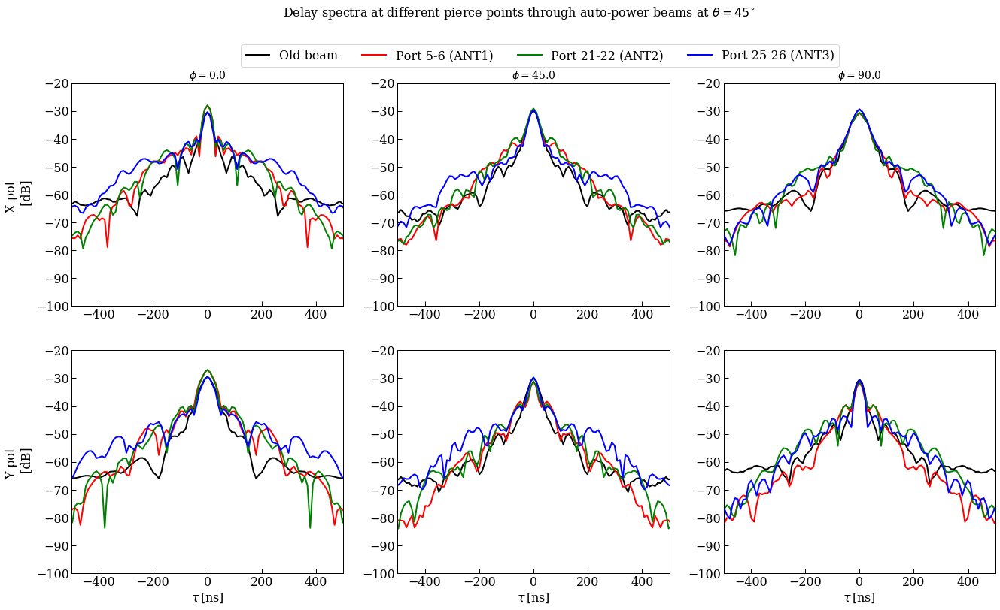

In [20]:
#Delay spectra of auto power beams for phi = 0,45.,90. at theta = 45
colors = ['k','r','g','b']

fig11, axs = plt.subplots(nrows=2,ncols=3,figsize=(22,12))
fig11.suptitle(r'Delay spectra at different pierce points through auto-power beams at $\theta = 45^{\circ}$',fontsize=16,y=1.)

for i in range(2):
    for j in range(3):
        
        for k in range(4):
        
                
            axs[i,j].plot(delays*1.e9,dB(F_Pbeams[k])[i,:,nearest_idx(theta,theta_in[1]),nearest_idx(phi,phi_rot[j])],lw=2,c=colors[k],
                          label=titles[k])
        
        axs[i,j].set_ylim(-100.,-20.)
        axs[i,j].set_xlim(-500.,500.)
        axs[i,j].tick_params(axis='both',direction='in',which='both',labelsize=16)
        
        if i==1:
            axs[i,j].set_xlabel(r'$\tau\,[$ns$]$',fontsize=16)
        else:
            if j==0:
                handles, labels = axs[i,j].get_legend_handles_labels()
                axs[i,j].legend(handles,labels,fontsize=16,ncol=4,loc='upper left',bbox_to_anchor=(0.6,1.2))
            axs[i,j].set_title(r'$\phi = $'+'%.1f'%(phi_rot[j]*180./np.pi),fontsize=14)
        

axs[0,0].set_ylabel('X-pol \n [dB]',fontsize=16)
axs[1,0].set_ylabel('Y-pol \n [dB]',fontsize=16)
        

Text(0, 0.5, 'Y-pol \n [dB]')

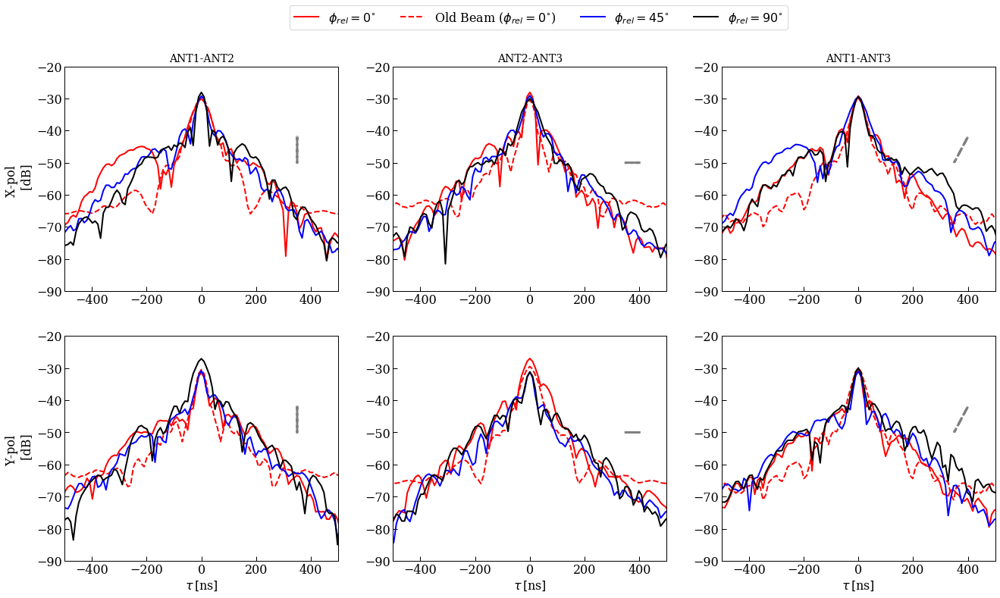

In [21]:
#Delay spectra of cross power beams for phi = 0,45.,90. relative to baseline orientation at theta = 45

colors = ['r','b','k']
labels = [r'$\phi_{rel} = 0^{\circ}$',r'$\phi_{rel} = 45^{\circ}$',r'$\phi_{rel} = 90^{\circ}$']

fig12, axs = plt.subplots(nrows=2,ncols=3,figsize=(22,12))

for i in range(2):
    for j in range(3):
        for k in range(3):
                
            phi_rel = phi_in[j] + phi_rot[k]
            if phi_rel == 2*np.pi:
                phi_rel = 0.
                    
            axs[i,j].plot(delays*1.e9,dB(F_ccbeams[j])[i,:,nearest_idx(theta,theta_in[1]),nearest_idx(phi,phi_rel)],lw=2,c=colors[k],label=labels[k])
        
            if phi_rot[k]==0.:
                axs[i,j].plot(delays*1.e9,dB(F_Pbeams[0])[i,:,nearest_idx(theta,theta_in[1]),nearest_idx(phi,phi_rel)],lw=2,c=colors[k],ls='--',
                              label=r'Old Beam ($\phi_{rel} = 0^{\circ}$)')
        
        axs[i,j].set_ylim(-90.,-20.)
        axs[i,j].set_xlim(-500.,500.)
        axs[i,j].tick_params(axis='both',direction='in',which='both',labelsize=16)
        
        axs[i,j].arrow(arrows[0],-50.,dx[j],dy[j],lw=3,ls='--',color='grey')
        
        if i==1:
            axs[i,j].set_xlabel(r'$\tau\,[$ns$]$',fontsize=16)
        else:
            axs[i,j].set_title(cc_titles[j],fontsize=14)
            if j==0:
                handles, labels = axs[i,j].get_legend_handles_labels()
                axs[i,j].legend(handles,labels,fontsize=16,ncol=4,loc='upper left',bbox_to_anchor=(0.8,1.3))
    
axs[0,0].set_ylabel('X-pol \n [dB]',fontsize=16)
axs[1,0].set_ylabel('Y-pol \n [dB]',fontsize=16)